# Setup

In [1]:
import os
import numpy as np
import torch
from sklearn.preprocessing import MinMaxScaler
from typing import List
import pandas as pd
import torch
import matplotlib.pyplot as plt
import seaborn as sns


os.chdir('/home/david/Desktop/projects/thesis/combined_downstream_upstram/')

config = {
    # general
    'seed': 123,
    'data_folder_path': './data/processed/',
    # training,
    'batch_size': 32,
    'n_epochs': 30,
    # architecture - to be changed later and pushed out towards tuning,
    'input_dimension': 12,
    'output_dimension': 12,              
    'hidden_dimmension':  128,           # d_model (int) – the number of expected features in the input (required)???,
    'attention_heads': 8,               # number of attention heads, if None then d_model//64,
    'encoder_number_of_layers': 8,
    'decoder_number_of_layers': 8,
    'dropout': 0.4,
    'clip': 1,
    'window': 450 ,
    'train_by_sample': 1,
    'positional_encodings': False,
    'n_iters':  None,                      # plot intermediate results on validation every <n_iters> steps,
    'model_type': "encoder_cnn",
    'saving_path': './models/transformer_cnn_4heads',
    'plot_saving_path': './plots/transformer_cnn_4heads',
    'scrutiny_probs': None,
}

# Utils

In [2]:

def plot_12_signals_of_three_sources(reading, predicted, plot_saving_path):
    """
    plot a 12 electrodes reading of before/after. For example, before and after corruption,
    and actutal vs. predicted.
    """
    fig, axs = plt.subplots(6, 2, figsize = (20,20))

    leads = ['LI', 'LII', 'LIII', 'aVF', 'aVL', 'aVR','V1','V2','V3','V4','V5','V6']
    s=0
    for ax in axs.flat:
        ax.plot(reading[s])
        ax.plot(predicted[s])
        ax.set_title(leads[s],fontsize=9)
        s+=1
    fig.suptitle('Blue-Original; Orange-Predicted')
    plt.tight_layout()
    if plot_saving_path:
        plt.savefig(f'{plot_saving_path}.png')
    plt.show()


class DataGenerator():
    def __init__(self,
                 metadata_file_path:str,   # path to metadata file
                 data_folder_path:str,     # path to individual signals
                 sample:str,               # sample we want to create a generator to. Either train, validation or test
                 targets:List,             # list of targets we want train on
                 batch_size:int,           # batch size
                 leads = np.arange(12),
                 shuffle:bool = True,       # Whether to shuffle the list of IDs at the end of each epoch.
                 fillna=None,
                 minimal_number_of_leads=None,
                 imputation_model = None
                 ):
        assert sample in ['train', 'validation', 'test'], "sample has to be in ['train', 'validation', 'test']"
        self.metadata = pd.read_csv(metadata_file_path)
        self.metadata=self.metadata[self.metadata['sample'] == sample].reset_index(drop=True)
        self.targets = targets
        self.data_path = data_folder_path
        self.list_IDs = self.metadata['reading'].values
        self.indices = np.arange(len(self.list_IDs))
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.fillna=fillna
        self.minimal_number_of_leads=minimal_number_of_leads
        self.leads_mask = leads

        if imputation_model:
            pass

    def _get_sample(self, signal_index):
        """
        load the relevant <lead> reading .npy file from <data_folder_path>. 
        Inputs:
        - signal_index: int
        - data_folder_path:str. The path to the folder when the desired file can be loaded from
        """

        file_name = f'{signal_index}.npy'
        X = np.load(self.data_path+file_name,allow_pickle=True)
        y = self.metadata[self.metadata['reading'] == signal_index][self.targets].values
        if len(y)>1:
            y = np.expand_dims(y[0],-1)
        return X,y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        import random
        if self.shuffle == True:
            # np.random.shuffle(self.indices)
            self.metadata = self.metadata.sample(frac=1).reset_index(drop=True)
    
    def __data_generation(self, list_IDs_temp):
        """
        Get a list of persons IDs and return a batch of signals.
        """

        samples = [self._get_sample(signal_index) for signal_index in list_IDs_temp]
        X = np.array([sample[0] for sample in samples])
        y = np.array([sample[1] for sample in samples]) 
        
        if self.fillna is not None:
            X = np.nan_to_num(X, nan=self.fillna)

        if self.minimal_number_of_leads:
            mask = np.array([np.count_nonzero(~np.isnan(X[j][:,0]))>self.minimal_number_of_leads for j in range(len(X))])
            X = X[mask]
            y = y[mask]

        # take only relevant leads
        X = np.array([X[i][self.leads_mask] for i in range(X.shape[0])])

        return X,y
    
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))
    
    
    def __getitem__(self, index):
        'Generate one batch of data using __data_generation'
        # Generate indexes of the batch
        indices = self.indices[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indices]

        # Generate data
        X,y = self.__data_generation(list_IDs_temp)
        
        return X,y



In [3]:
def get_best_model(folder_path = './upstream_seq2seq/models/', model_name = 'transformer_cnn_4heads'):
    """
    Since that in the upstream stage we save basically every model, it is important to 
    take the one that minimized the loss over the validation set.
    """
    model_files = [x for x in os.listdir(folder_path) if model_name in x and 'loss' not in x]

    # get timestemps
    timestemps = [float(x.replace('transformer_cnn_4heads_', '').replace('.pt','')) for x in model_files]
    timestemps.sort()

    # get best model (the last one that has been saved)
    best_model_path = folder_path+model_name+'_'+str(timestemps[-1])+'.pt'
    return best_model_path


# Run

In [4]:
from modeling.Transformer import TSTransformerEncoderCNN
import torch

input_dimension          = config['input_dimension']
output_dimension         = config['output_dimension']
hidden_dimmension        = config['hidden_dimmension']
attention_heads          = config['attention_heads']
encoder_number_of_layers = config['encoder_number_of_layers']
positional_encodings     = config['positional_encodings']
dropout                  = config['dropout']
clip                     = config['clip']
device                   = 'cuda'

upstream_path = get_best_model(folder_path = '/home/david/Desktop/projects/thesis/upstream_seq2seq/models/', model_name = 'transformer_cnn_4heads')

model = TSTransformerEncoderCNN(input_dimension, output_dimension, 
                            hidden_dimmension, attention_heads, 
                            encoder_number_of_layers, dropout).to(device)


model.load_state_dict(torch.load(upstream_path))
print(model)

Num attention heads: 8
TSTransformerEncoderCNN(
  (project_input): Linear(in_features=12, out_features=128, bias=True)
  (encoder): Linear(in_features=12, out_features=128, bias=True)
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-7): 8 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
        )
        (linear1): Linear(in_features=128, out_features=512, bias=True)
        (dropout): Dropout(p=0.4, inplace=False)
        (linear2): Linear(in_features=512, out_features=128, bias=True)
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.4, inplace=False)
        (dropout2): Dropout(p=0.4, inplace=False)
      )
    )
  )
  (output_layer): Linear(in_features=128, out_features=12, bias=True)
  (dropout1): Dropout(p=0.4, 

In [5]:
metadata_path_mac = '/Users/davidharar/Documents/School/thesis/downstream_classification/data/combined_data/metadata_only_existant_readings_09042023.csv'
metadata_path_linux = '/home/david/Desktop/projects/thesis/downstream_classification/data/combined_data/metadata_only_existant_readings_09042023.csv'
individual_signals_path_mac = '/Users/davidharar/Documents/School/thesis/downstream_classification/data/individual-signals/'
individual_signals_path_linux = '/home/david/Desktop/projects/thesis/downstream_classification/data/individual-signals/'

sample='train'
targets=['one_year_until_death']
batch_size=4


# --------------------------------
# Usage example
# --------------------------------

train_generator = DataGenerator(
    metadata_file_path= metadata_path_linux,              # path to metadata file
    data_folder_path = individual_signals_path_linux,     # path to individual signals
    sample=sample,                                  # sample we want to create a generator to. Either train, validation or test
    targets=targets,                                # list of targets we want train on
    batch_size=batch_size,                          # batch size
    shuffle=True,                                    # Whether to shuffle the list of IDs at the end of each epoch.
    fillna=0
                 )

X,y = train_generator.__getitem__(1224)
print(X.shape, y.shape)
X,y



(4, 12, 450) (4, 1, 1)


(array([[[0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.

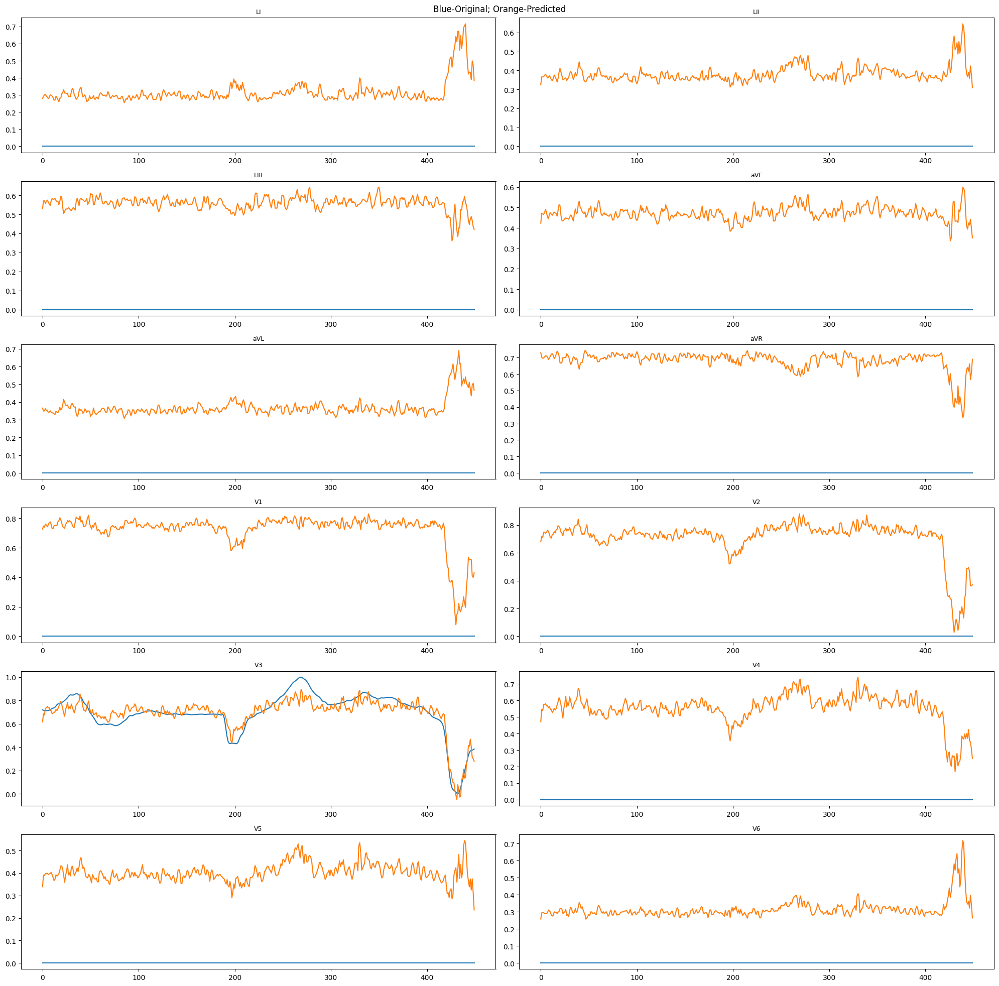

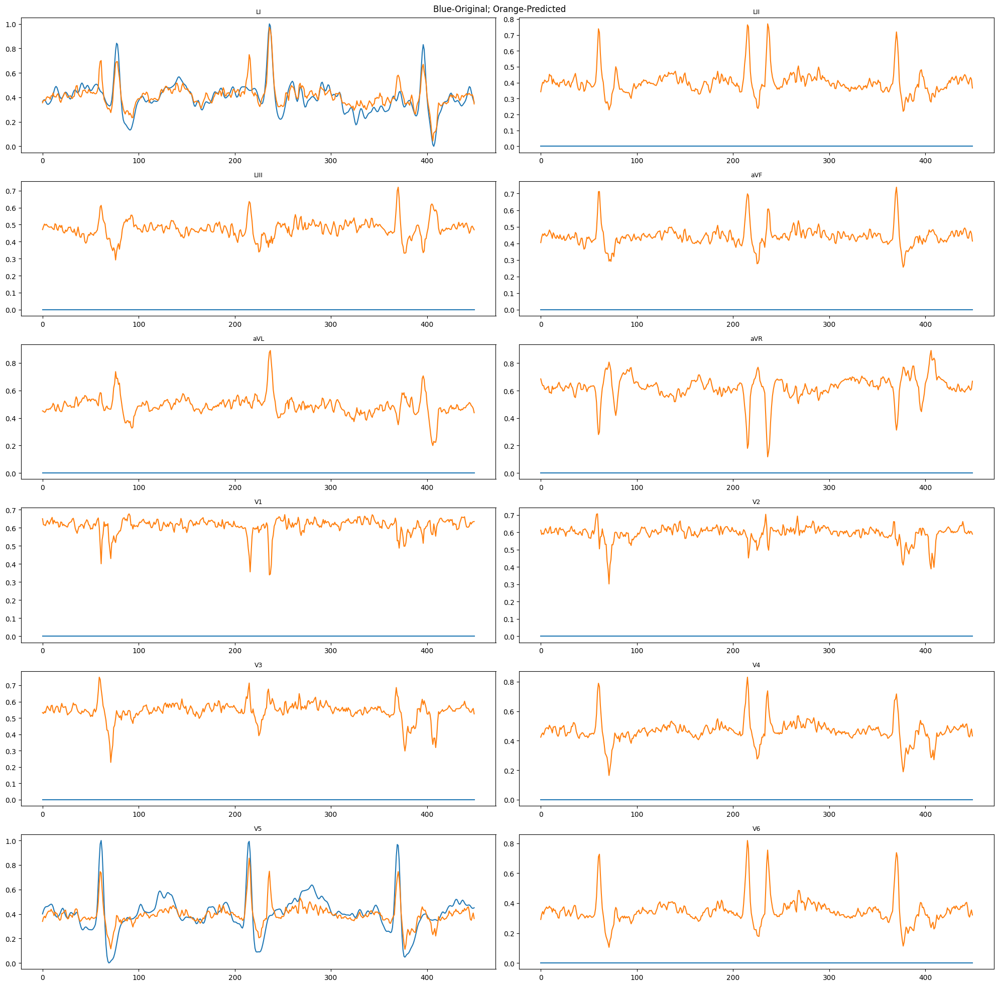

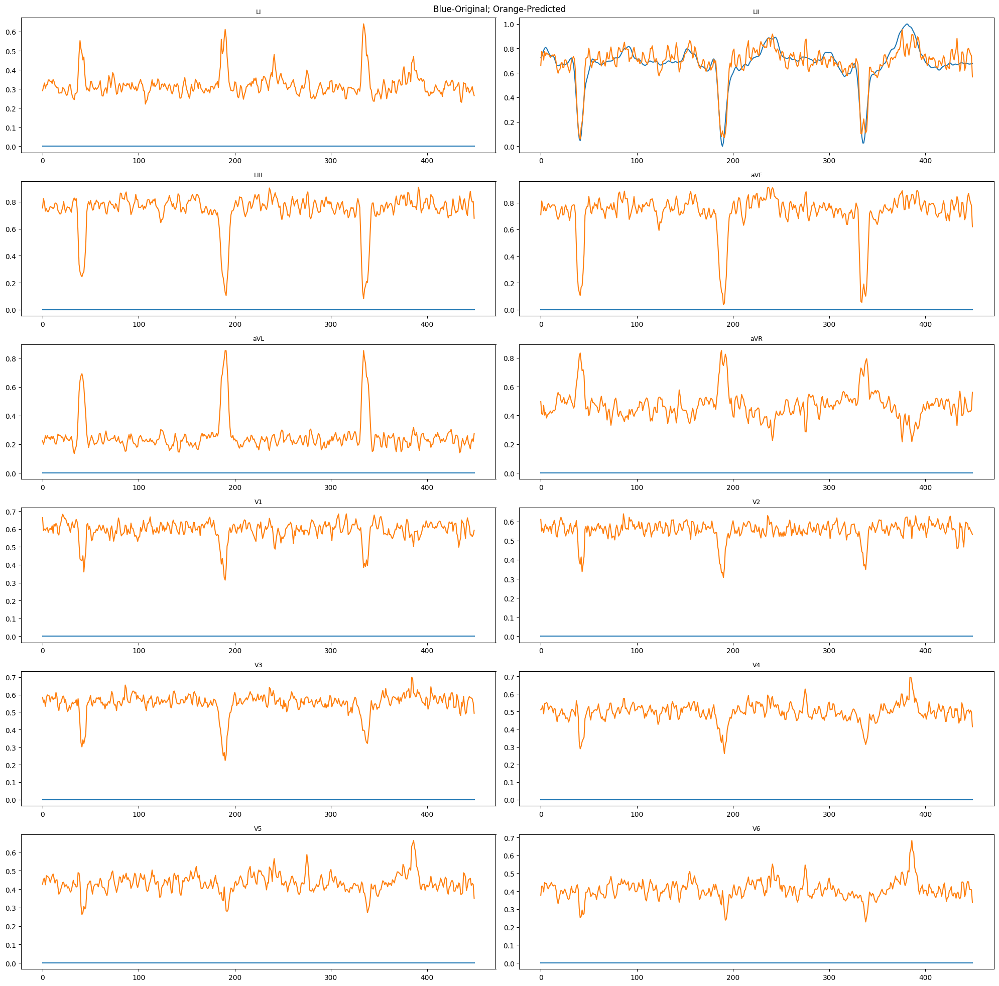

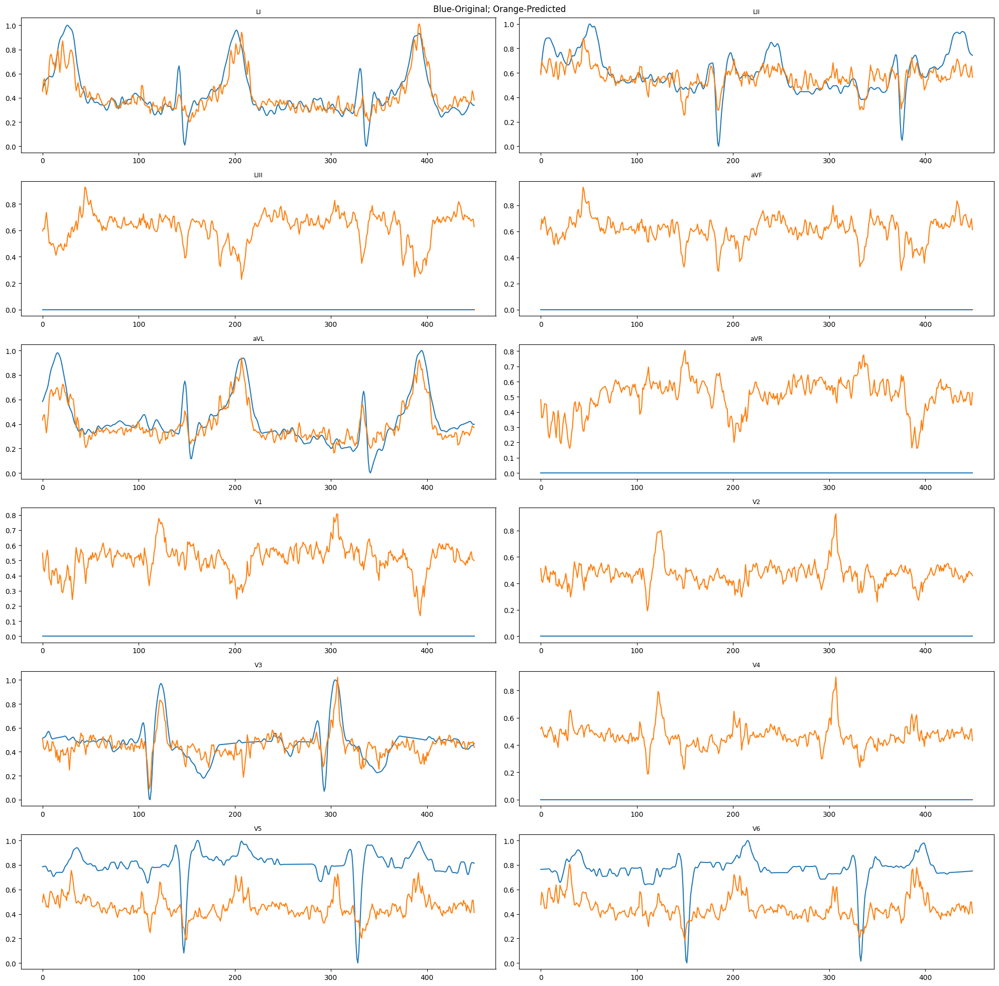

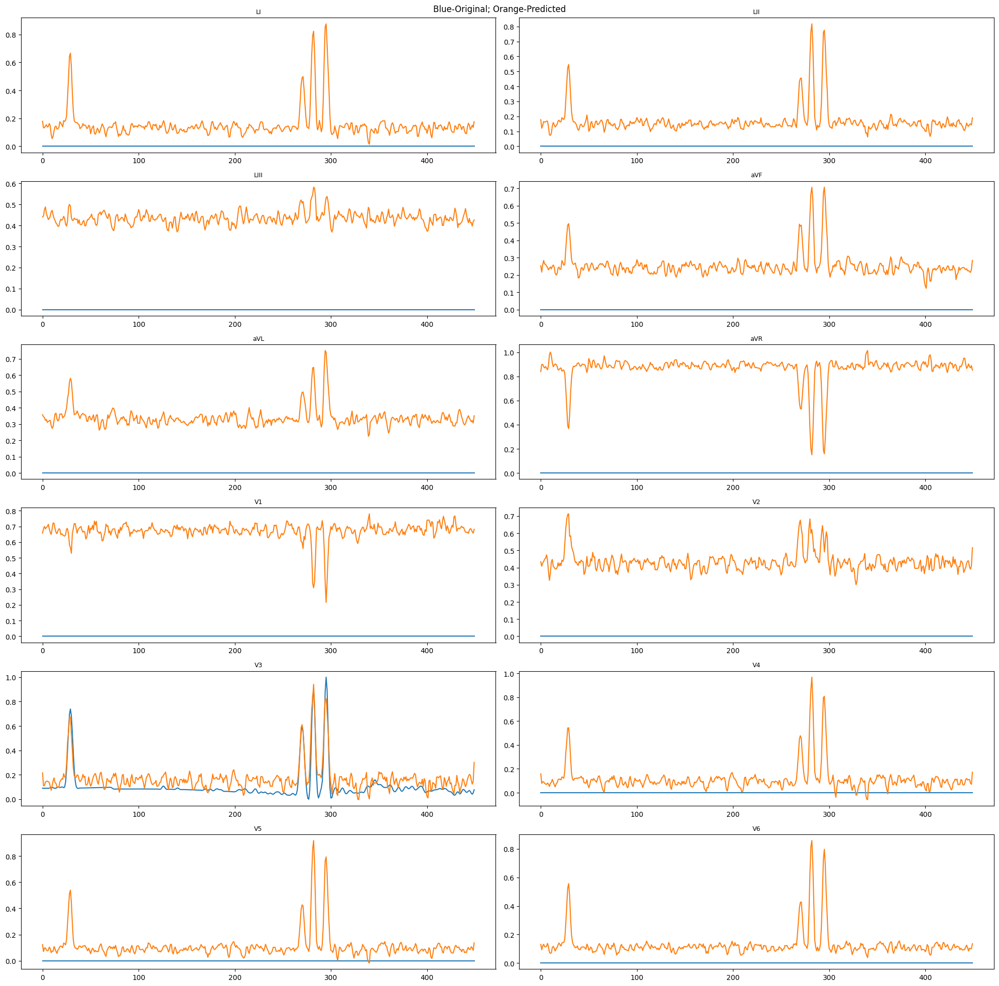

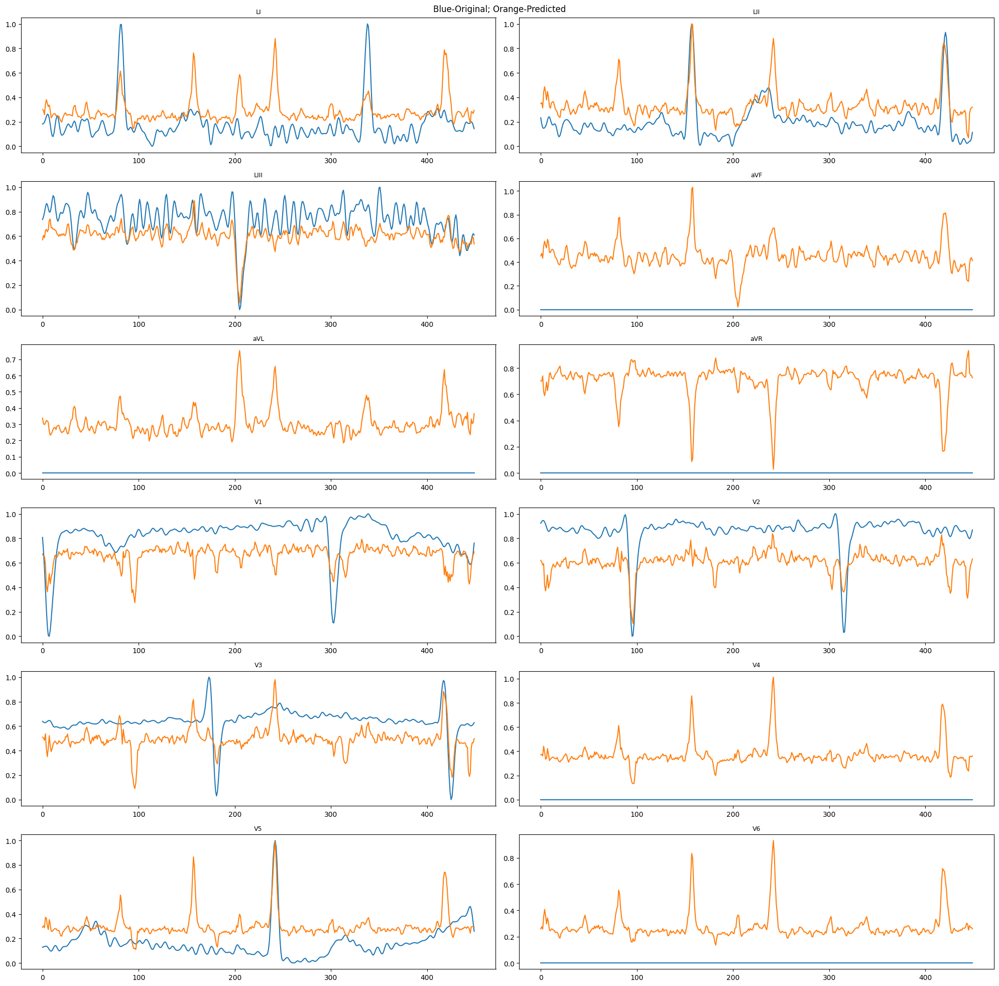

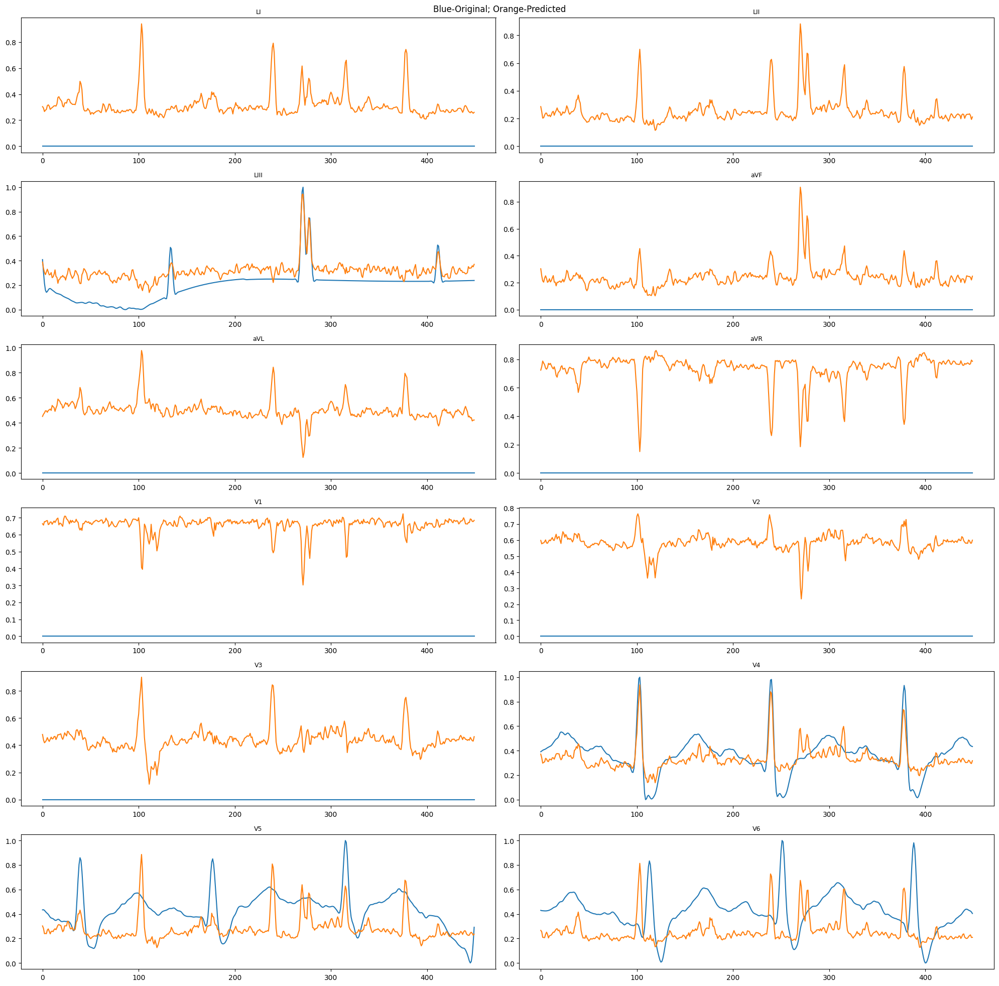

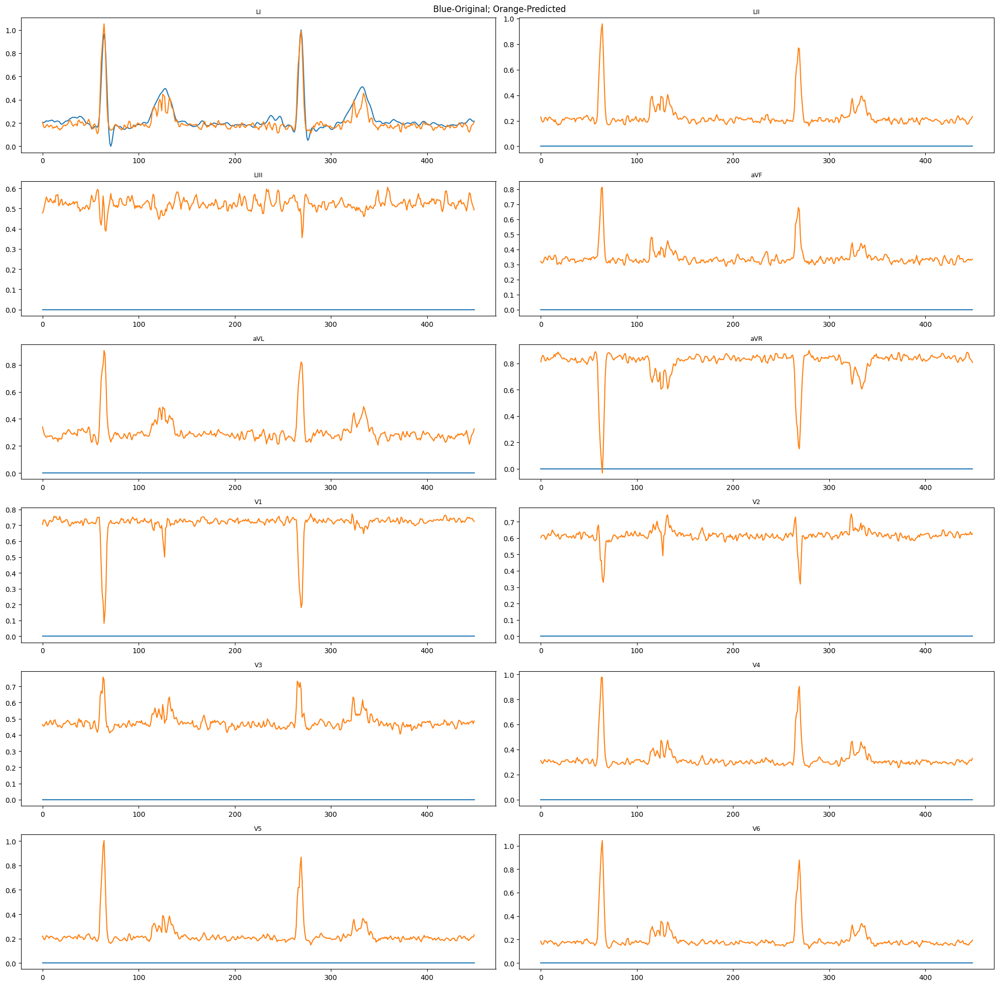

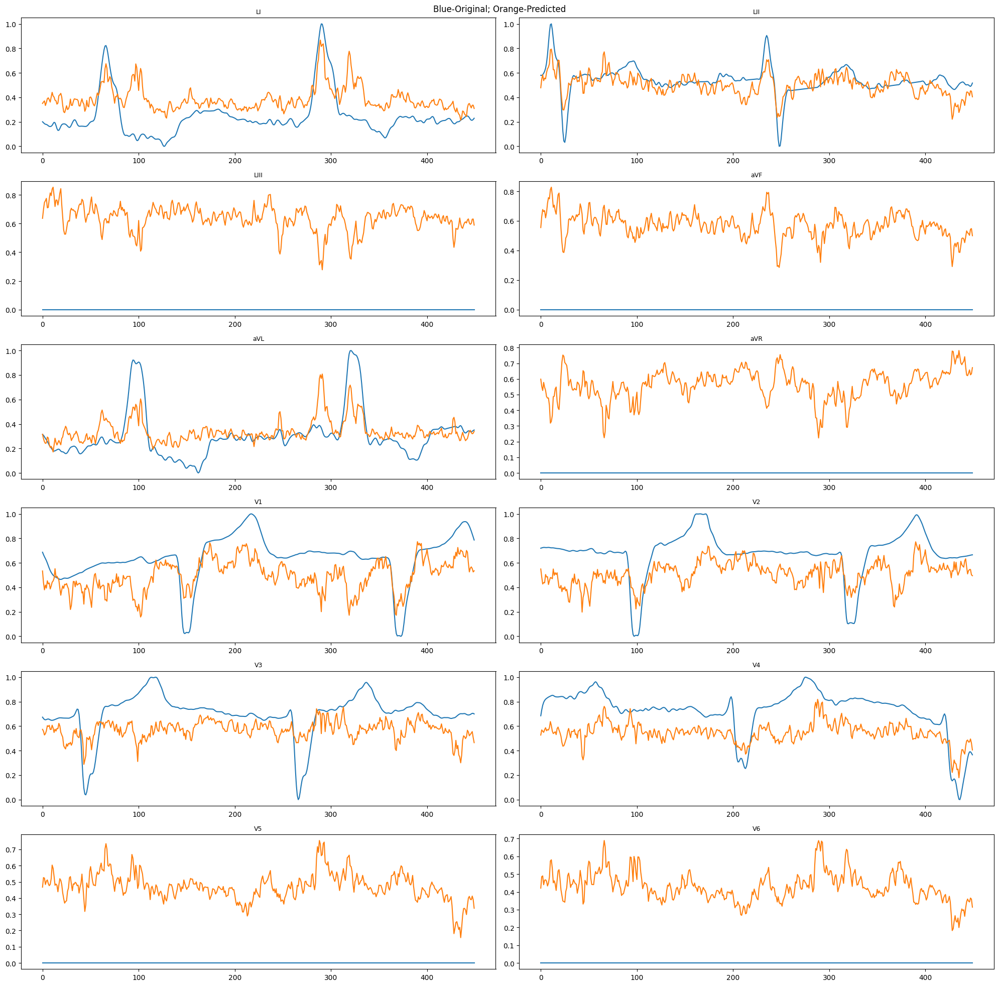

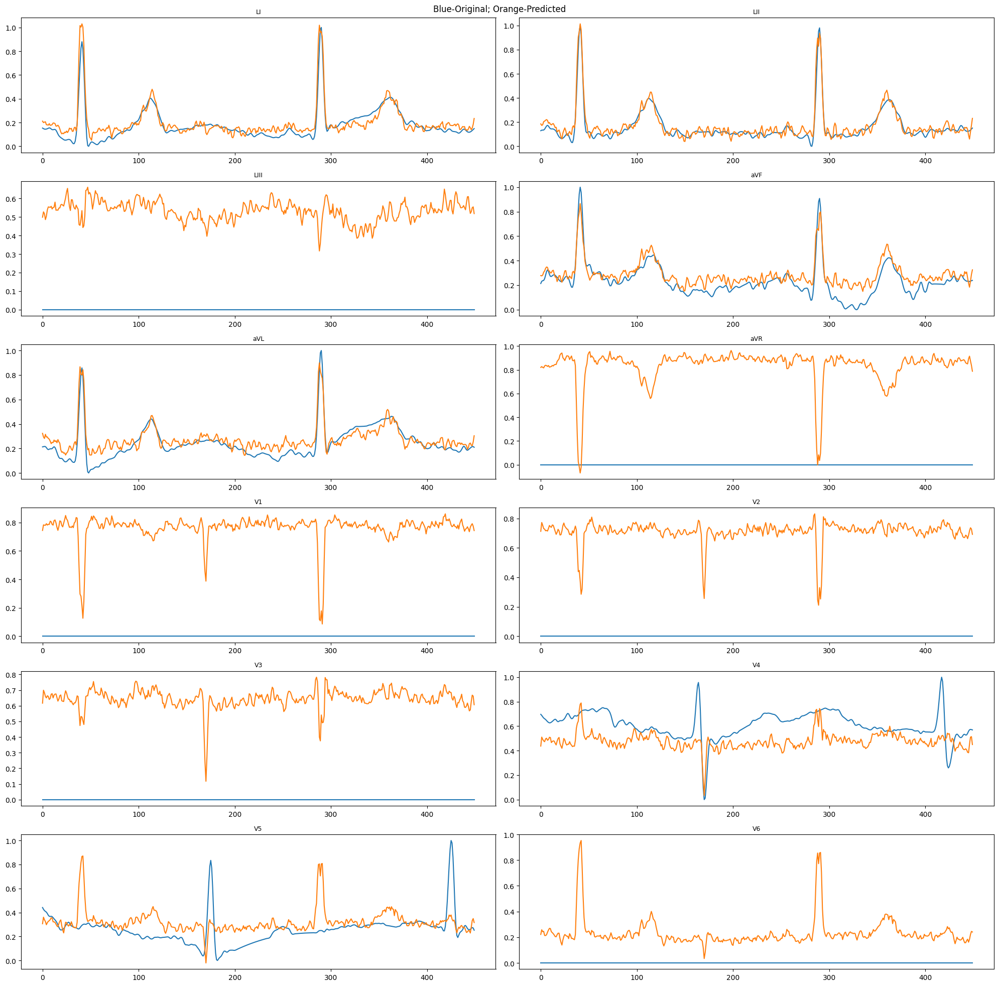

In [24]:
for _ in range(10):
    S = np.random.randint(0,1000,1)[0]
    src_, _ = train_generator.__getitem__(S)
    src_ = np.float32(np.transpose(src_, axes=(2,0,1)))

    # move to gpu so we can pass through model
    src_ = torch.from_numpy(src_).to(device)

    # choose which signal from the first batch to look at
    batch_size = src_.shape[1]
    sig_to_plot = np.random.randint(0,batch_size,1)

    with torch.no_grad():
        y_pred = model(src_,None).cpu().numpy()


    corrupted = np.squeeze(src_[:,sig_to_plot,:].cpu().numpy()).T
    reconstructed = np.squeeze(y_pred[:,sig_to_plot,:]).T

    plot_12_signals_of_three_sources(corrupted,reconstructed, None)



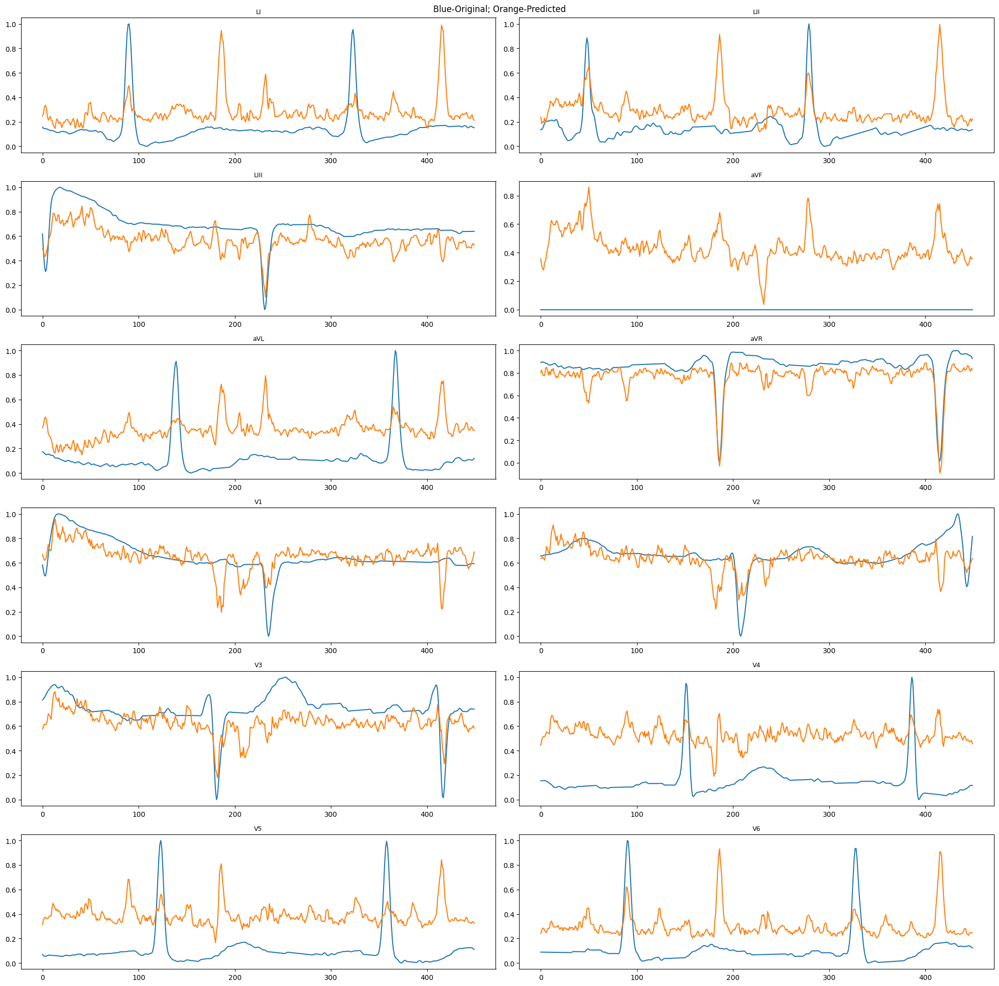

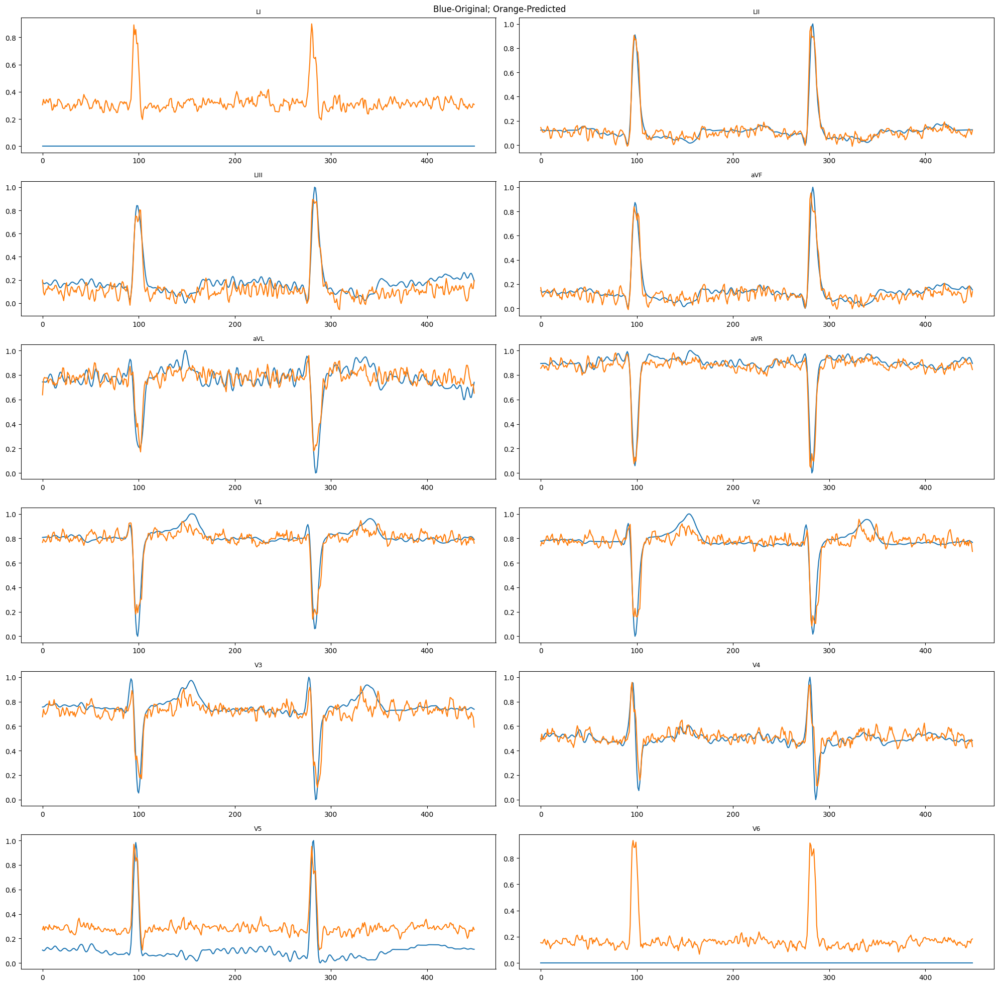

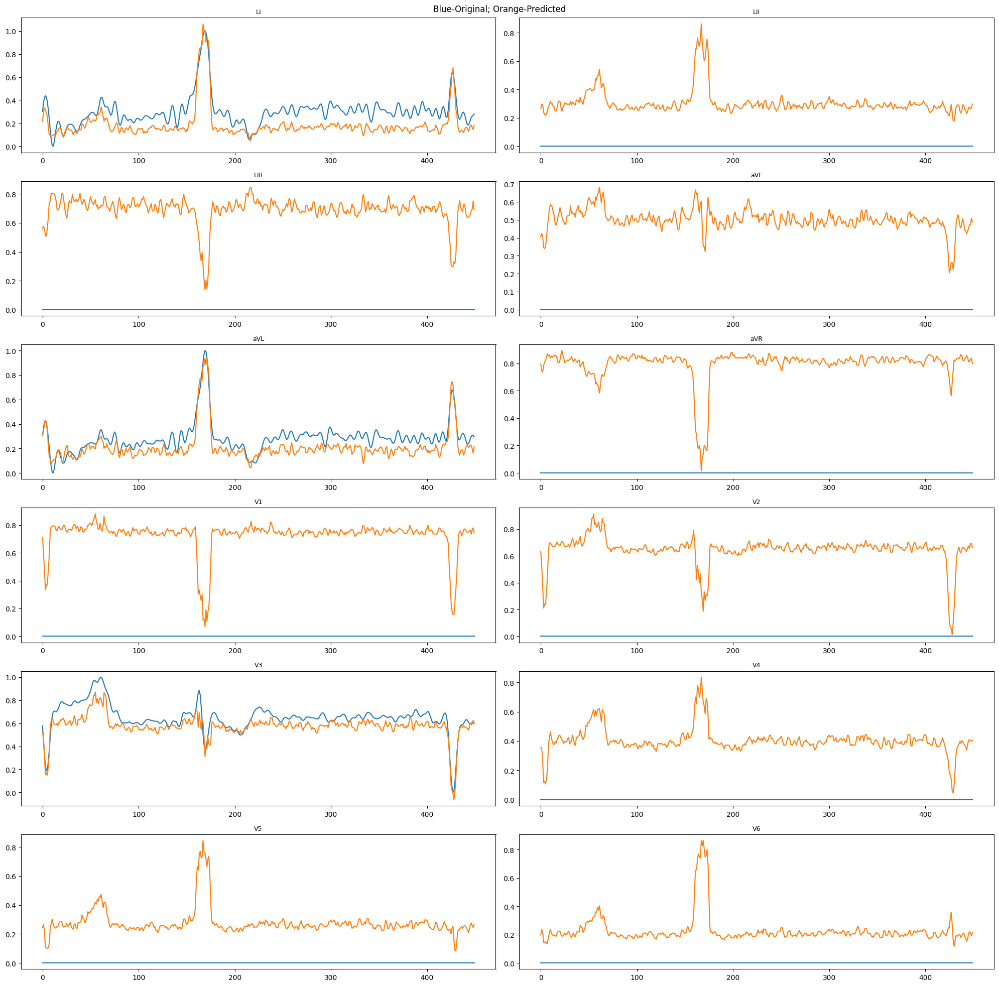

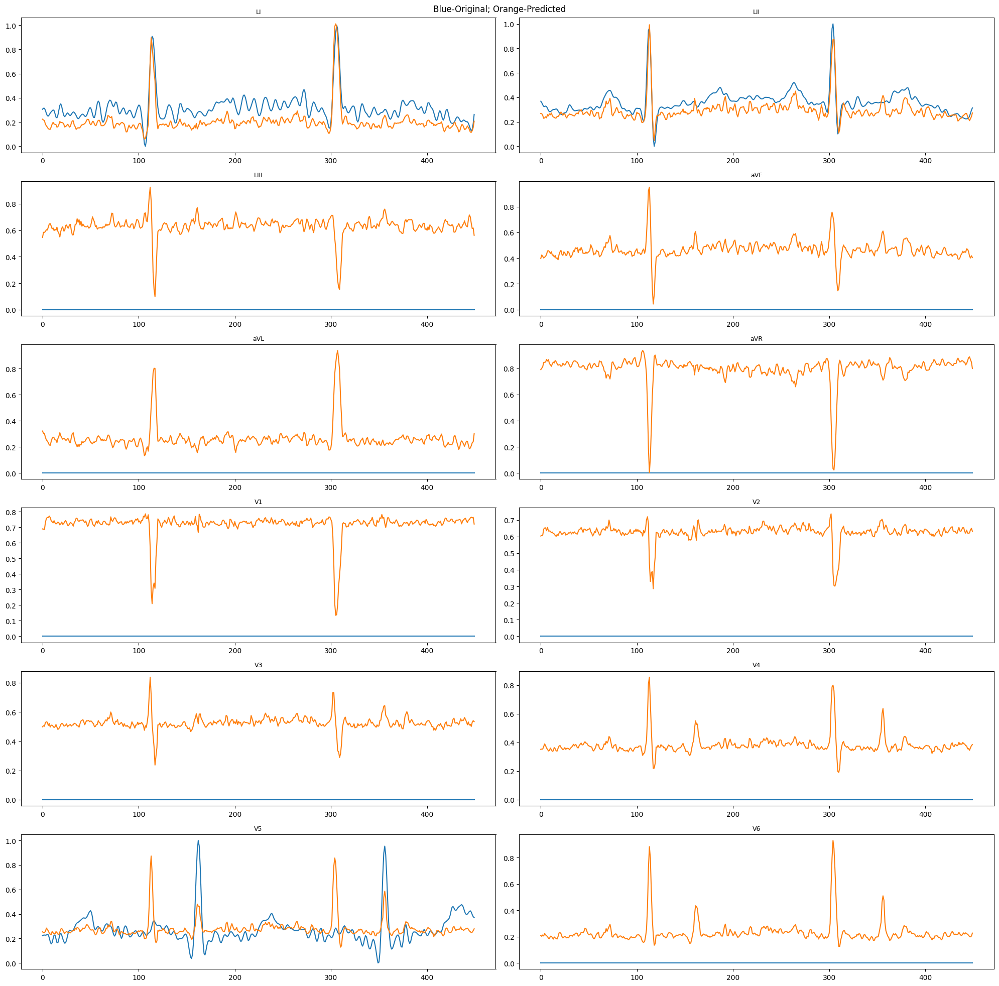

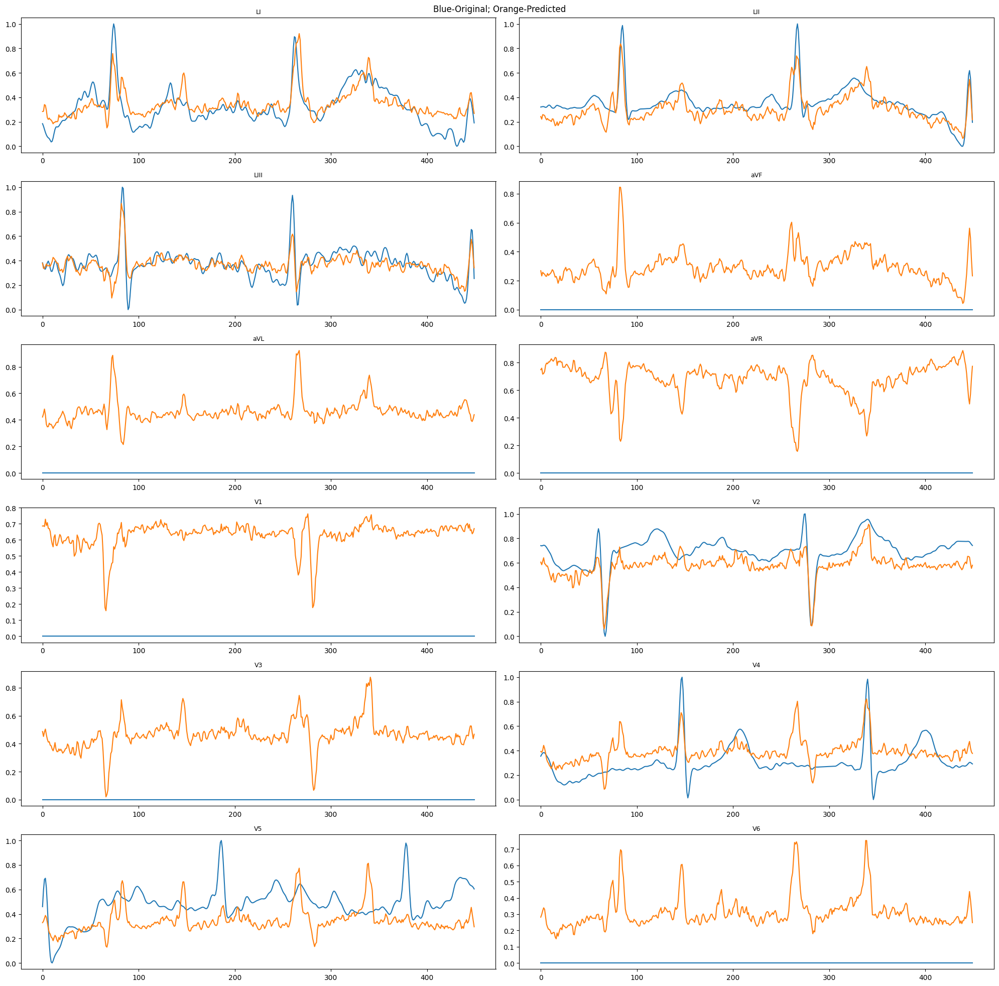

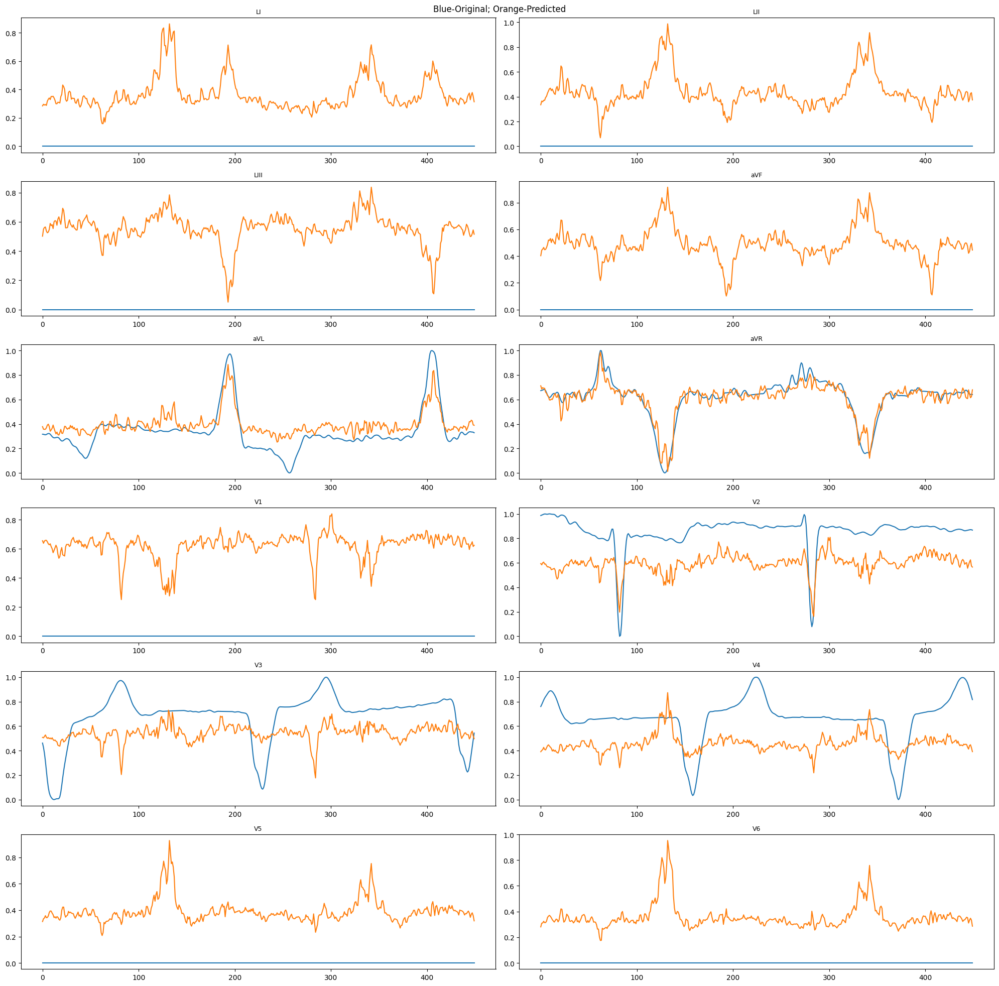

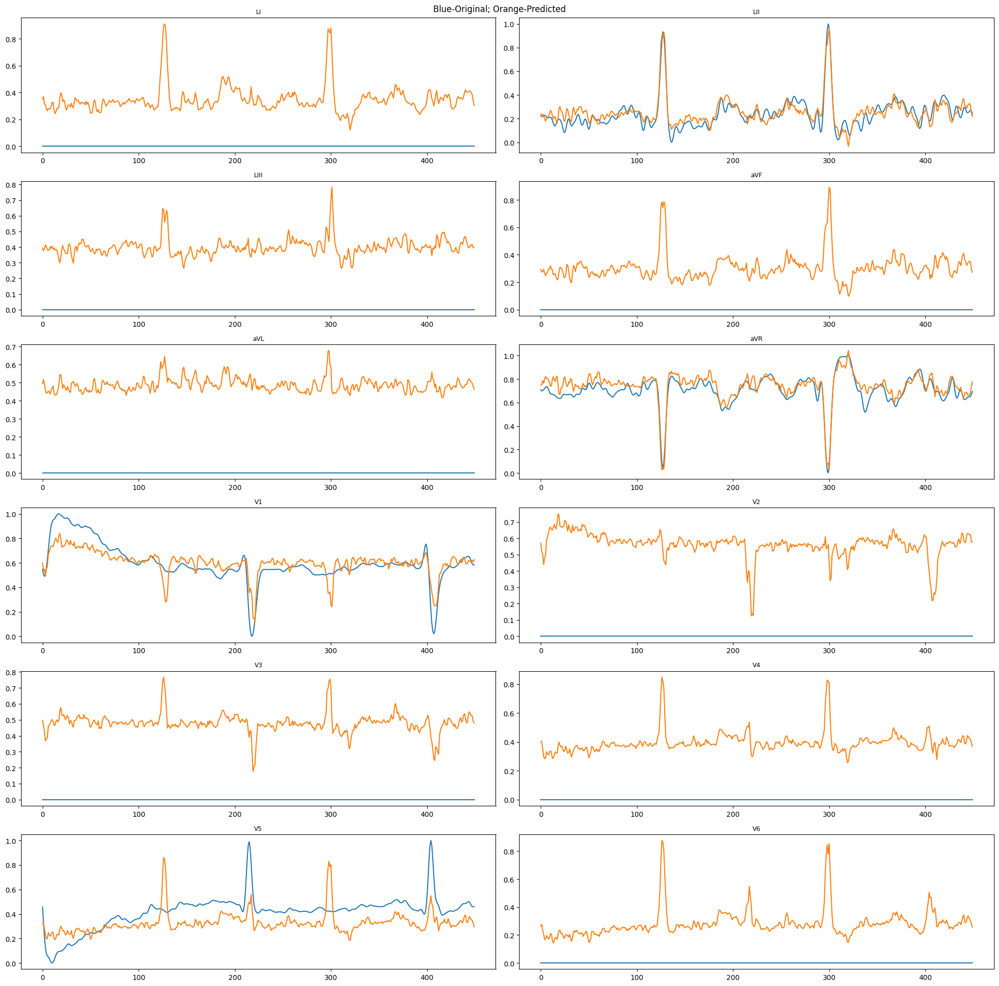

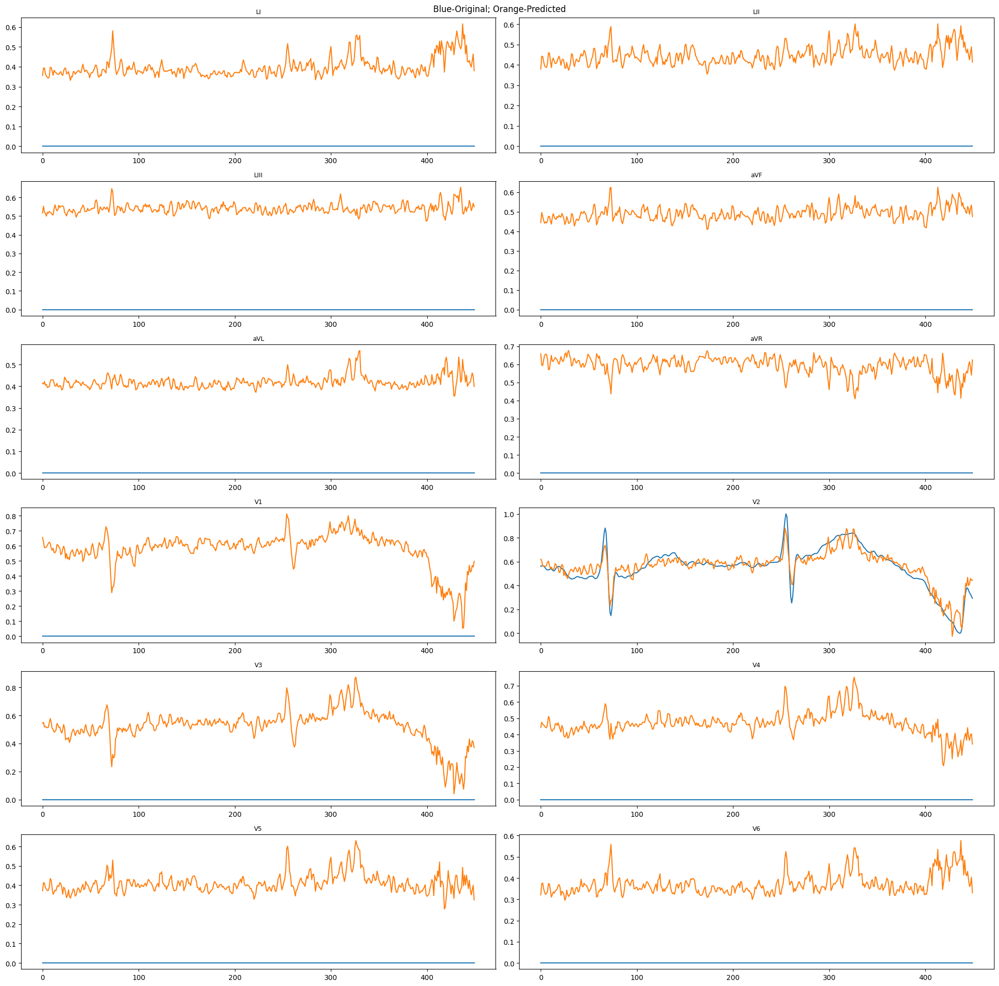

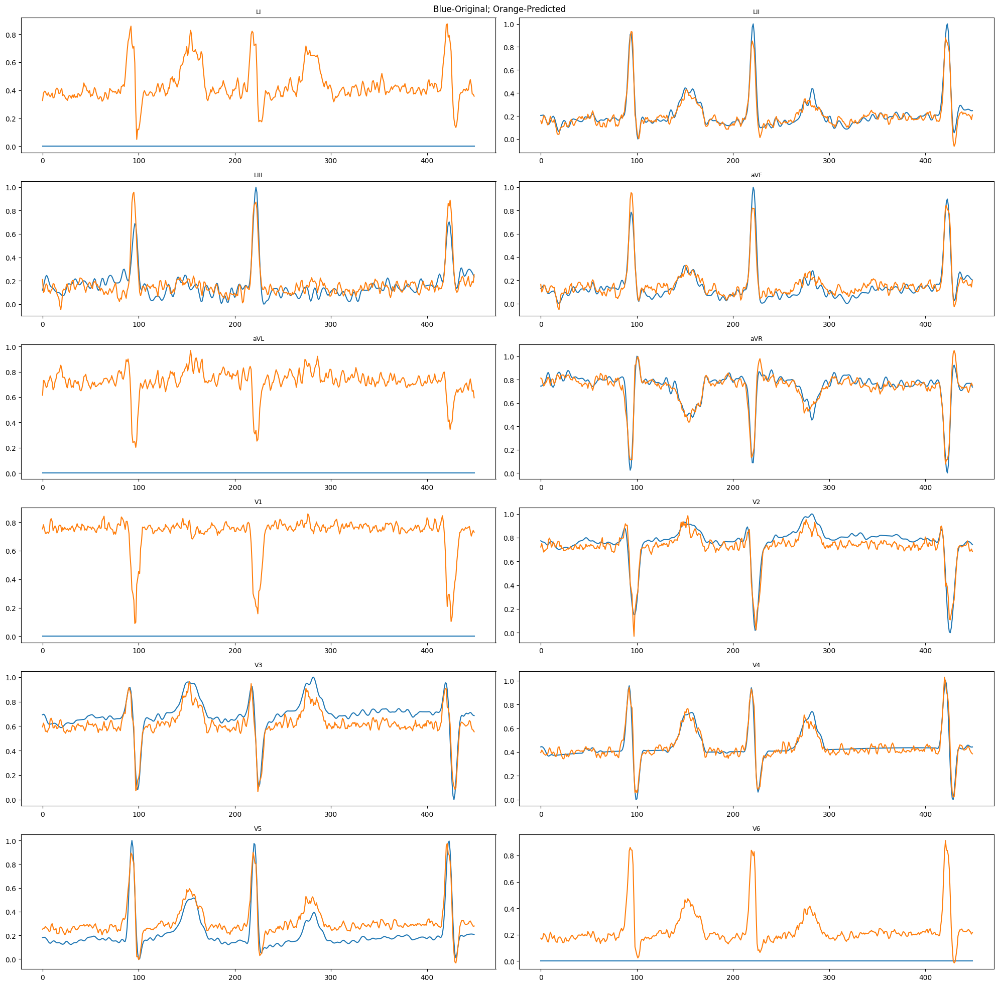

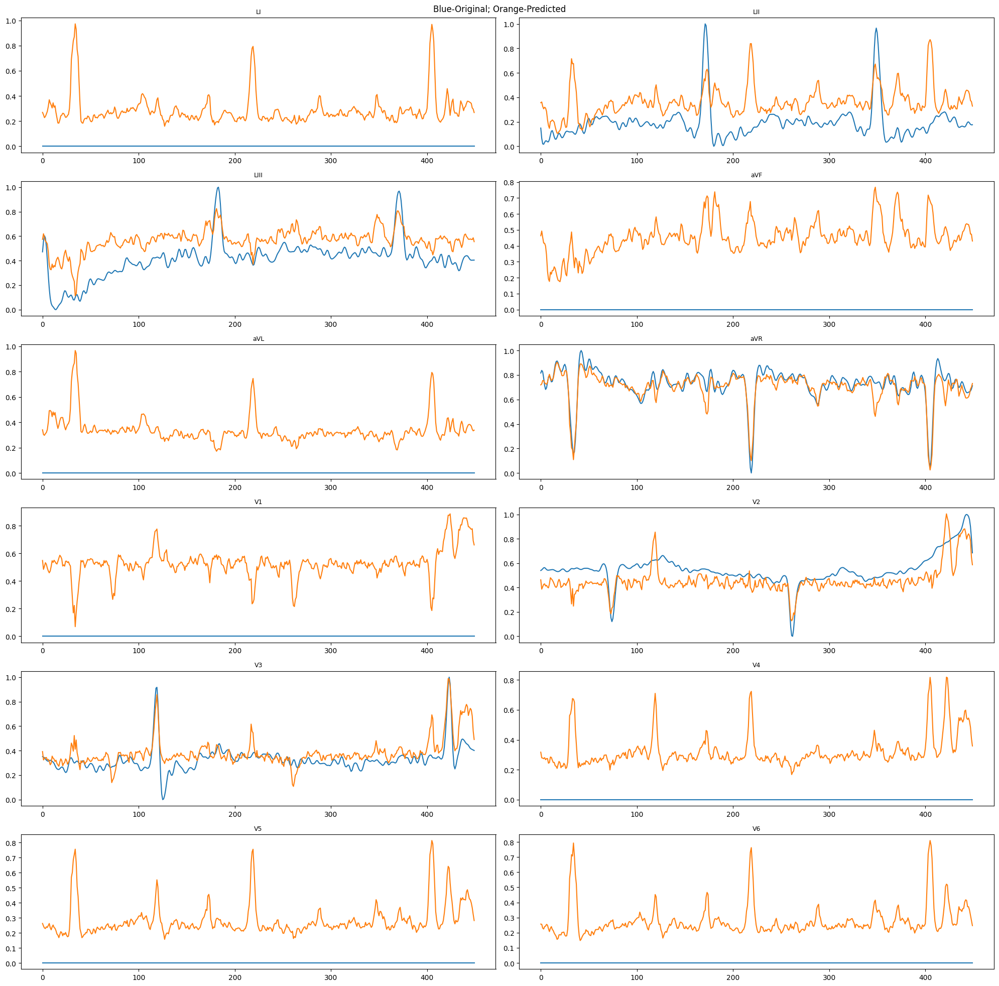

In [25]:
for _ in range(10):
    S = np.random.randint(0,1000,1)[0]
    src_, _ = train_generator.__getitem__(S)
    src_ = np.float32(np.transpose(src_, axes=(2,0,1)))

    # move to gpu so we can pass through model
    src_ = torch.from_numpy(src_).to(device)

    # choose which signal from the first batch to look at
    batch_size = src_.shape[1]
    sig_to_plot = np.random.randint(0,batch_size,1)

    with torch.no_grad():
        y_pred = model(src_,None).cpu().numpy()


    corrupted = np.squeeze(src_[:,sig_to_plot,:].cpu().numpy()).T
    reconstructed = np.squeeze(y_pred[:,sig_to_plot,:]).T

    plot_12_signals_of_three_sources(corrupted,reconstructed, None)



# MSE

In [27]:
print('s')

s
